# Neutrino IceCube EDA

The purpose of the EDA notebook will be to establish a understanding of the dataset provided by the Hosts of the Kaggle competition.

The libraries that I will be using for this particvalur Notebook, will consist of pandas; in order to read in the data in a dataframe. I will be using maplotlib and plotly for the visualizations. The motivation for using plotly is due to the fact that the data relates to a 3D space. Plotly allows for interactive visuals within the juyter notebook enviroment, making it easier for the user of the notebook to grasp how the data is set up

In [1]:
# Importing the necessary Libraries in order to effectively perform EDA

import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import plotly.express as px
from pathlib import Path
import plotly
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import math

Before continuing with the EDA, lets first establish the contents of the dataset we have downloaded from Kaggle. To do this, I will output the files found within the directory path.

In [2]:
# define a function that will display the content within the given directory.

def display_directory_structure(root_dir, level=0):
    for item in os.listdir(root_dir):
        item_path = os.path.join(root_dir, item)
        if os.path.isdir(item_path):
            print("|   " * level + "|-- " + item + "/")
            display_directory_structure(item_path, level + 1)
        else:
            print("|   " * level + "|-- " + item)

root_directory = "icecube-neutrinos-in-deep-ice"
display_directory_structure(root_directory)

|-- .ipynb_checkpoints/
|-- sample_submission.parquet
|-- sensor_geometry.csv
|-- test/
|   |-- batch_661.parquet
|-- test_meta.parquet
|-- train/
|   |-- batch_1.parquet
|   |-- batch_10.parquet
|   |-- batch_100.parquet
|   |-- batch_101.parquet
|   |-- batch_102.parquet
|   |-- batch_103.parquet
|   |-- batch_104.parquet
|   |-- batch_105.parquet
|   |-- batch_106.parquet
|   |-- batch_107.parquet
|   |-- batch_108.parquet
|   |-- batch_109.parquet
|   |-- batch_11.parquet
|   |-- batch_110.parquet
|   |-- batch_111.parquet
|   |-- batch_112.parquet
|   |-- batch_113.parquet
|   |-- batch_114.parquet
|   |-- batch_115.parquet
|   |-- batch_116.parquet
|   |-- batch_117.parquet
|   |-- batch_118.parquet
|   |-- batch_119.parquet
|   |-- batch_12.parquet
|   |-- batch_120.parquet
|   |-- batch_121.parquet
|   |-- batch_122.parquet
|   |-- batch_123.parquet
|   |-- batch_124.parquet
|   |-- batch_125.parquet
|   |-- batch_126.parquet
|   |-- batch_127.parquet
|   |-- batch_128.parquet


Looking at the output results, we immediately see that we have 2 different data files that we need to work with. the sensor_geometry file is laoded as a .csv file, while the remainder of the files are all .parquet files.

__sample_submission.parquet__: This file contains a sample of the expected submission format for the Kaggle competition. It's often used to understand the structure of how the final submission should look.

__sensor_geometry.csv__: This file contains information related to the sensor geometry used in the dataset.

__test_meta.parquet__: This file could contain metadata or additional information about the test data.

__batch_661.parquet__: This is the test batch file, possibly containing test data samples.

__batch_1.parquet - batch_660.parquet__: These are training batch files, possibly containing training data samples. The numbers in the filenames indicate different training batches.

### Understanding .CSV and .Parquet Files

A __CSV (Comma-Separated Values)__ file is a plain text format used for storing tabular data, where each line of the file represents a row of data, and the values within a row are separated by commas or other specified delimiters.

__Parquet__, an open-source file format, is purpose-built to handle extensive datasets with complex structures using a flat columnar storage approach. This format excels in managing substantial volumes of intricate data due to its efficient data compression and broad encoding support.

In [3]:
# create a path to establish the directory of our dataset

data_path = Path('C:/Users/chris/Desktop/Research/icecube-neutrinos-in-deep-ice')

In [4]:
# Looking at the Sample submission 

df = pd.read_parquet(data_path /'sample_submission.parquet')
df.head()

,event_id,azimuth,zenith
0,2092,1,1
1,7344,1,1
2,9482,1,1


What the above tells us is that our predicted output needs to be aligned with the output displayed. The sample submission file will not be used for any training/test purposes, but is merely there to depict the required output. What we can infer from this, is that when creating a submission, the predicted output must display the event (the dependant variable) and the direction from which the neutrino particle came from. 

### Browse Sensor Geometry

In [5]:
sensor_geometry = pd.read_csv(data_path /'sensor_geometry.csv')
sensor_geometry.head()

,sensor_id,x,y,z
0,0,-256.14,-521.08,496.03
1,1,-256.14,-521.08,479.01
2,2,-256.14,-521.08,461.99
3,3,-256.14,-521.08,444.97
4,4,-256.14,-521.08,427.95


In [6]:
sensor_geometry.shape

(5160, 4)

In [7]:
fig = px.scatter_3d(sensor_geometry, x="x", y="y", z="z", color="z")

fig.update_traces(marker=dict(size=2, symbol='circle'))
fig.update_layout(
    font=dict(family="PT Sans", size=12, color="black"),
    title="3D Plot of the Sensor Layout",
    scene=dict(
        xaxis_title="X Axis Label",
        yaxis_title="Y Axis Label",
        zaxis_title="Z Axis Label"
    )
)

fig.show()

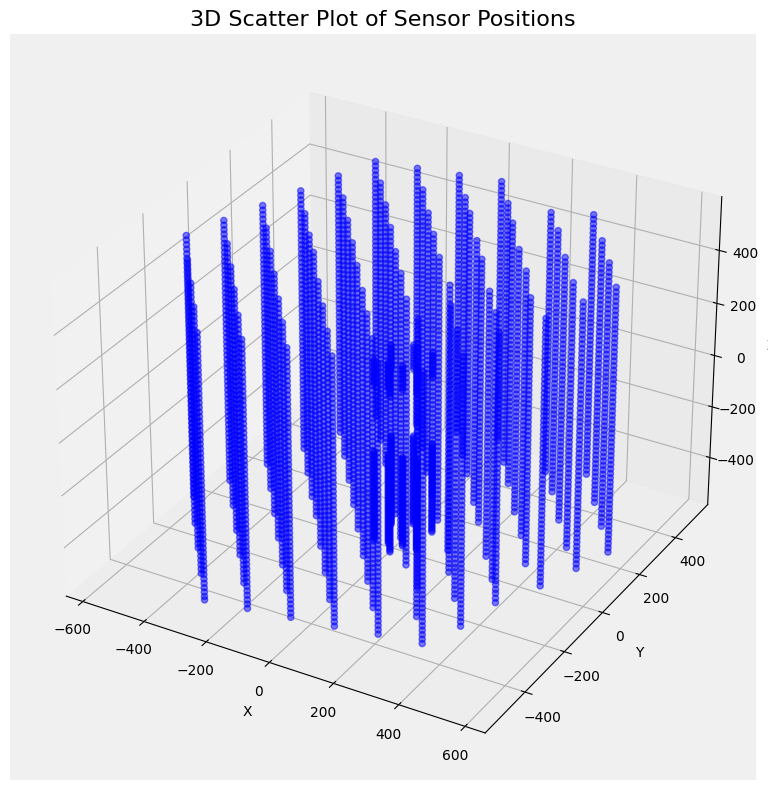

In [8]:
# Create a figure and a subplot with 3D projection
fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(111, projection='3d')

# Scatter plot with customized color, size, and alpha (transparency)
ax.scatter(sensor_geometry['x'], sensor_geometry['y'], sensor_geometry['z'], s=20, c='b', alpha=0.5)

# Set labels and title
ax.set_xlabel("X")
ax.set_ylabel("Y")
ax.set_zlabel("Z")
ax.set_title("3D Scatter Plot of Sensor Positions")

# Customize grid lines
ax.grid(True, linestyle='dotted', linewidth=0.8, alpha=0.7)

# Customize background color
ax.set_facecolor('#f0f0f0')  # Light gray background

# Customize axis tick labels font
ax.tick_params(axis='x', labelsize=10)
ax.tick_params(axis='y', labelsize=10)
ax.tick_params(axis='z', labelsize=10)

# Customize title font
ax.title.set_fontsize(16)

# Adjust plot layout for better visibility of labels
fig.tight_layout()

# Show the plot
plt.show()

In [9]:
def count_batches(path):
    counter = sum(1 for item in path.glob('*') if item.is_file())
    return counter

data_path

train_batches = count_batches(data_path / "train")
test_batches = count_batches(data_path / "test")

print(f'Batches in train folder: {train_batches}')
print(f'Batches in test folder: {test_batches}')

Batches in train folder: 660
Batches in test folder: 1


In [10]:
train_batch = pd.read_parquet(data_path / "train" / "batch_1.parquet")
print(f"Shape: {train_batch.shape}")
train_batch.head(5)

Shape: (32792416, 4)


,sensor_id,time,charge,auxiliary
event_id,,,,
24,3918,5928,1.325,True
24,4157,6115,1.175,True
24,3520,6492,0.925,True
24,5041,6665,0.225,True
24,2948,8054,1.575,True


In [11]:
print(f"Events in train batch: {train_batch.index.nunique()}")

Events in train batch: 200000


In [12]:
pulses_in_batch = pd.DataFrame(train_batch.groupby('event_id').size(), columns=["number_of_pulses"])
pulses_in_batch.head(10)

,number_of_pulses
event_id,
24,61
41,51
59,36
67,142
72,62
77,50
79,316
82,45
121,41


In [13]:
pulses_in_batch.describe()

,number_of_pulses
count,200000.000000
mean,163.962080
std,1497.540355
min,15.000000
25%,48.000000
50%,63.000000
75%,89.000000
max,110517.000000


In [14]:
fig = px.histogram(pulses_in_batch,log_y=True,title="Number of pulses in events (log scale)"
)
fig.show()

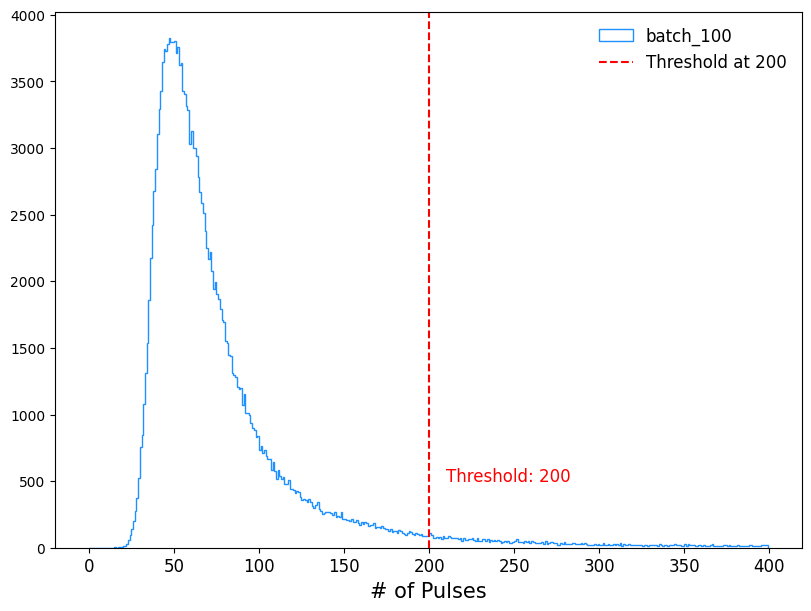

In [15]:
# Sample data (replace with your actual data)
pulses_in_batch

fig, ax = plt.subplots(figsize=(8, 6), constrained_layout=True)
bins = np.arange(0, 400, 1)

# Create the histogram
ax.hist(pulses_in_batch, histtype='step', label='batch_100', bins=bins, color='dodgerblue')

# Add a vertical line at x=96
vertical_line_x = 200
ax.axvline(vertical_line_x, color='red', linestyle='--', label='Threshold at 200')
ax.text(vertical_line_x + 10, 500, 'Threshold: 200', color='red', fontsize=12)

# Labels and styling
ax.set_xlabel('# of Pulses', size=15)
ax.set_xticks(np.arange(0, 401, 50))
ax.set_xticklabels([str(i) for i in np.arange(0, 401, 50)], size=12)
ax.legend(fontsize=12, loc='upper right', frameon=False)

plt.show()

In [16]:
event_time_lengths = pd.DataFrame(train_batch.groupby('event_id')['time'].agg(np.ptp))

# Create the histogram with custom styling
fig = px.histogram(
    event_time_lengths,
    x="time",
    title="Length of Events (in nanoseconds)",
    labels={"time": "Time (nanoseconds)"},
    template="plotly",
    nbins=80,  # Adjust the number of bins for the histogram
    opacity=0.7,  # Adjust the opacity of bars
    color_discrete_sequence=["#3498db"]  # Set a custom color for the bars
)

# Customize the layout
fig.update_layout(
    xaxis=dict(showgrid=True, gridcolor='lightgray'),
    yaxis=dict(showgrid=True, gridcolor='lightgray'),
    plot_bgcolor='white',
    paper_bgcolor='white',
    bargap=0.1,  # Adjust the gap between bars
)

# Show the figure
fig.show()

In [17]:
test_batch = pd.read_parquet(data_path / "test" / "batch_661.parquet")
print(f"Shape: {test_batch.shape}")
test_batch.head(10)

Shape: (378, 4)


,sensor_id,time,charge,auxiliary
event_id,,,,
2092,4066,6170,1.275,True
2092,3512,6374,0.975,True
2092,897,6378,1.475,True
2092,2060,6590,0.925,True
2092,3072,6625,1.075,True
2092,2181,6690,1.425,True
2092,2145,7425,0.225,True
2092,4366,7430,1.025,True
2092,367,7544,0.725,True


In [18]:
print(f"Events in test batch: {test_batch.index.nunique()}")

Events in test batch: 3


In [19]:
test_meta = pd.read_parquet(data_path /"test_meta.parquet")
print(f"Shape: {test_meta.shape}")
test_meta.head()

Shape: (3, 4)


,batch_id,event_id,first_pulse_index,last_pulse_index
0,661,2092,0,298
1,661,7344,299,334
2,661,9482,335,377


In [20]:
train_meta = pd.read_parquet(data_path /"train_meta.parquet")
print(f"Shape: {train_meta.shape}")
train_meta.head()

Shape: (131953924, 6)


,batch_id,event_id,first_pulse_index,last_pulse_index,azimuth,zenith
0,1,24,0,60,5.029555,2.087498
1,1,41,61,111,0.417742,1.549686
2,1,59,112,147,1.160466,2.401942
3,1,67,148,289,5.845952,0.759054
4,1,72,290,351,0.653719,0.939117


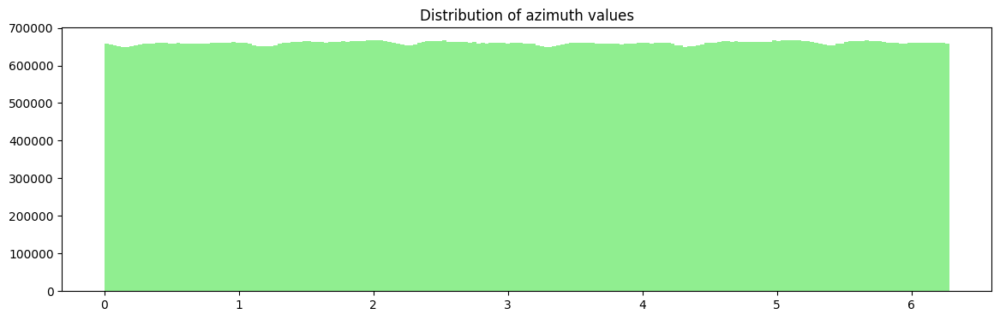

In [21]:
fig, ax = plt.subplots(figsize=(14, 4))
ax.hist(train_meta["azimuth"], bins=200, color="lightgreen")
ax.set_title("Distribution of azimuth values");

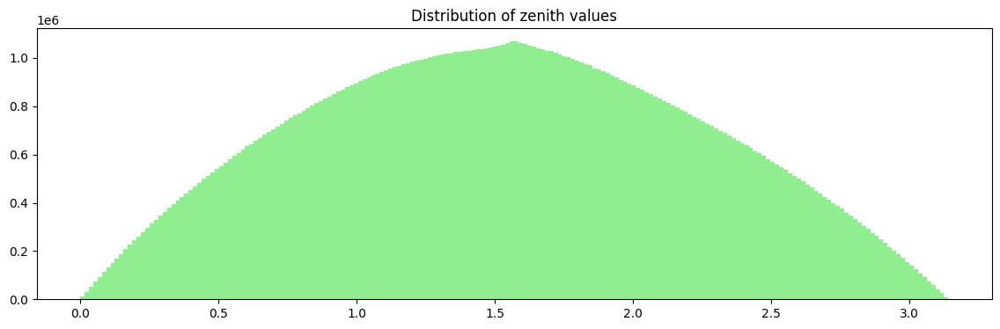

In [22]:
fig, ax = plt.subplots(figsize=(14, 4))
ax.hist(train_meta["zenith"], bins=200, color="lightgreen")
ax.set_title("Distribution of zenith values");

In [27]:
import plotly.graph_objects as go

In [42]:
def visualize_event(pulse_id: str, sensor_geometry: pd.DataFrame, pulses_data: pd.DataFrame, meta_data: pd.DataFrame):
    event_pulses = pulses_data.loc[pulse_id]
    meta_of_event = meta_data.loc[meta_data["event_id"] == pulse_id]

    fig = make_subplots(rows=1, cols=2, specs=[[{"type": "scatter3d"}, {"type": "scatter3d"}]], subplot_titles=("All events", "Not auxiliary events"))
    
    for aux_value in [True, False]:
        pulses_subset = event_pulses[event_pulses["auxiliary"] == aux_value]
        df = pulses_subset.merge(sensor_geometry, left_on='sensor_id', right_on='sensor_id')[["x", "y", "z", "charge", "time"]]

        fig.add_trace(
            go.Scatter3d(x=df["x"], y=df["y"], z=df["z"], opacity=0.75, mode='markers', marker_size=df["charge"]*10, text=df["charge"], marker=dict(color=df["time"], cmin=0, cmax=df.iloc[-1]["time"])),
            row=1, col=1 if aux_value else 2
        )

    for col in [1, 2]:
        fig.add_trace(
            go.Scatter3d(x=sensor_geometry["x"], y=sensor_geometry["y"], z=sensor_geometry["z"], mode='markers', opacity=0.3, marker=dict(size=1, color="black")),
            row=1, col=col
        )

    azimuth, zenith = meta_of_event["azimuth"].values[0], meta_of_event["zenith"].values[0]
    true_x = math.cos(azimuth) * math.sin(zenith)
    true_y = math.sin(azimuth) * math.sin(zenith)
    true_z = math.cos(zenith)
    
    line_trace = go.Scatter3d(
        x=[-true_x * 500, true_x * 500], y=[-true_y * 500, true_y * 500], z=[-true_z * 500, true_z * 500],
        opacity=0.8, mode='lines', line=dict(color='red', width=5)
    )
    fig.add_trace(line_trace, row=1, col=1)
    fig.add_trace(line_trace, row=1, col=2)
    
    fig.update_layout(title_text=f"Event {pulse_id}")
    
    fig.show()

In [43]:
visualize_event(24, sensor_geometry, train_batch, train_meta)

In [37]:
visualize_event(41, sensor_geometry, train_batch, train_meta)

In [24]:
visualize_event(59, sensor_geometry, train_batch, train_meta)

In [25]:
visualize_event(72, sensor_geometry, train_batch, train_meta)